In [3]:
s="links.txt|*.d|*.p|*.s|*.yaml|*.ll|*.statcords|*.srf|*.gsf|*.csv|*.info|*.stoch|*.png|*.m4v|*.pertb|nzvm.cfg|model_*|gridout*|gridfile*|setSrfParams.py|list.txt"
l=s.split("|")

In [7]:
"\' -or -name \'".join(l)

"links.txt' -or -name '*.d' -or -name '*.p' -or -name '*.s' -or -name '*.yaml' -or -name '*.ll' -or -name '*.statcords' -or -name '*.srf' -or -name '*.gsf' -or -name '*.csv' -or -name '*.info' -or -name '*.stoch' -or -name '*.png' -or -name '*.m4v' -or -name '*.pertb' -or -name 'nzvm.cfg' -or -name 'model_*' -or -name 'gridout*' -or -name 'gridfile*' -or -name 'setSrfParams.py' -or -name 'list.txt"

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
stations = pd.read_csv("real_nz_stations.ll",sep=' ',header=None,index_col=2,names=['lon','lat','station'])
crs={'init':'epsg:4326'}

              lon      lat                     geometry
station                                                
001A     174.3194 -35.7251  POINT (174.31940 -35.72510)
002A     171.8001 -41.7314  POINT (171.80010 -41.73140)
003A     171.4831 -41.7483  POINT (171.48310 -41.74830)
007A     175.5408 -37.1388  POINT (175.54080 -37.13880)
007B     175.5408 -37.1388  POINT (175.54080 -37.13880)
...           ...      ...                          ...
WWAF     167.3638 -44.9429  POINT (167.36380 -44.94290)
WWRF     167.3662 -44.9447  POINT (167.36620 -44.94470)
YARM     173.0598 -42.2371  POINT (173.05980 -42.23710)
YUPC     175.5505 -38.3157  POINT (175.55050 -38.31570)
ZIHA     169.0498 -43.8853  POINT (169.04980 -43.88530)

[2164 rows x 3 columns]


/home/seb56/anaconda3/envs/conda39/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<AxesSubplot:>

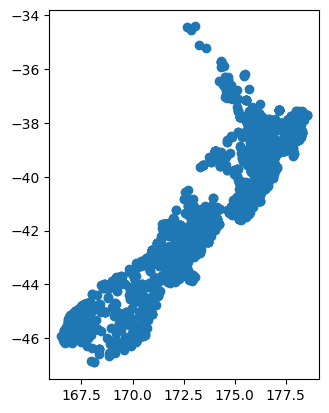

In [3]:
geometry=[Point(xy) for xy in zip(stations["lon"], stations["lat"])]
geodata=gpd.GeoDataFrame(stations,crs=crs, geometry=geometry)
print(geodata)
geodata.plot()

Text(121.89661607272832, 0.5, 'Latitude')

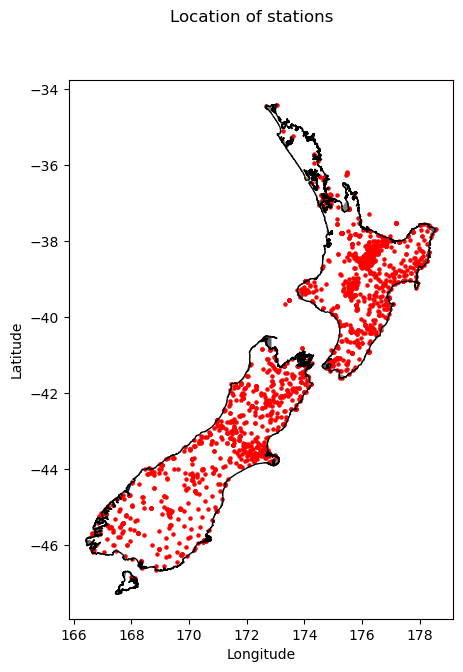

In [32]:
nz_shapefile = gpd.read_file('nz_coastlines/nz-coastlines-topo-150k.shp')

fig, ax = plt.subplots(figsize=(7,7))

nz_shapefile.plot(ax=ax, facecolor='Grey', edgecolor='k',alpha=1,linewidth=1,cmap="cividis")

#You can use different 'cmaps' such as jet, plasma,magma, infereno,cividis, binary...(I simply chose cividis)

geodata.plot(ax=ax,color='red', markersize=5); #Add argument ax=ax
fig.suptitle('Location of stations', fontsize=12)
ax.set_xlabel('Longitude', fontsize=10)
ax.set_ylabel('Latitude', fontsize='medium')

In [36]:
coastlines = gpd.read_file('nz_coastlines/nz-coastlines-topo-150k_polygon.shp')

In [37]:
coastlines

,FID,geometry
0,0,"POLYGON ((167.52050 -47.20026, 167.52045 -47.2..."
1,1,"POLYGON ((167.89329 -44.62506, 167.89314 -44.6..."
2,2,"POLYGON ((174.74638 -36.61875, 174.74719 -36.6..."


<AxesSubplot:>

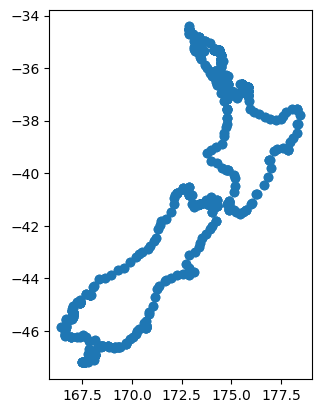

In [24]:
nz_shapefile["boundary"].plot()

In [40]:
geodata.within(coastlines)

/home/seb56/anaconda3/envs/conda39/lib/python3.9/site-packages/geopandas/base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")
/tmp/ipykernel_1826711/3333645692.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  geodata.within(coastlines)


001A    False
002A    False
003A    False
007A    False
007B    False
        ...  
YUPC    False
ZIHA    False
0       False
1       False
2       False
Length: 2167, dtype: bool

In [31]:
geodata.explore()

In [21]:
nz_shapefile.explore()

In [41]:
import pandas as pd
ims_df=pd.read_csv("AlpineF2K_REL01.csv",index_col=0)

In [44]:

all_stations = pd.read_csv("non_uniform_whole_nz_with_real_stations-hh400_v20p3_land.ll",sep=' ',header=None,index_col=2,names=['lon','lat','station'])


In [51]:
pgv_data=ims_df.join(all_stations,how="right")[['lon','lat','PGV']] #joining 2 dataframes on index "station" name
pgv_data=pgv_data.fillna(0)
print(pgv_data)

                lon        lat  PGV
station                            
HNPS     176.880100 -39.671000  0.0
TRMS     175.991000 -40.671300  0.0
NSPS     176.915900 -39.489600  0.0
MWZ      177.527800 -38.334000  0.0
NCDS     176.876100 -39.498400  0.0
...             ...        ...  ...
4201628  178.289215 -38.370208  0.0
4201629  178.318050 -37.887453  0.0
420162a  178.323742 -37.891944  0.0
420162b  178.318050 -37.896436  0.0
420162c  178.312358 -37.891944  0.0

[25948 rows x 3 columns]


In [52]:
pgv_data.loc[pgv_data.PGV>0]

,lon,lat,PGV
station,,,
LSRC,172.5433,-42.8695,14.294131
WIGC,172.8003,-42.7012,9.925778
SJFS,172.1803,-42.3346,12.983865
CSTC,172.3813,-43.3123,21.988272
WAKC,172.7052,-42.9631,11.968987
...,...,...,...
DECF,166.9727,-45.2026,30.636755
AICS,171.6244,-42.7682,19.747044
CSBF,166.8693,-45.2931,28.072823


In [8]:
import geopandas

path_to_data = geopandas.datasets.get_path("nybb")
gdf = geopandas.read_file(path_to_data)

gdf

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


<AxesSubplot:>

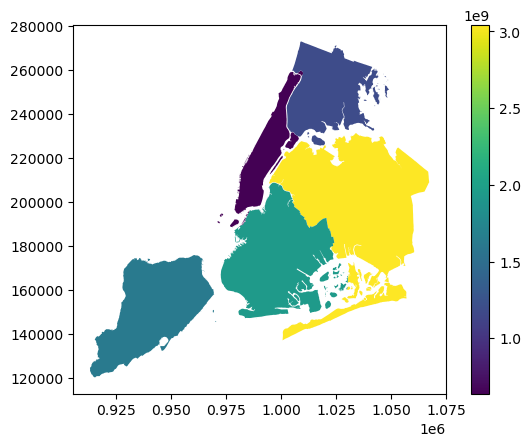

In [10]:
gdf = gdf.set_index("BoroName")
gdf["area"] = gdf.area
gdf.plot("area", legend=True)

In [22]:
gdf

,BoroCode,Shape_Leng,Shape_Area,geometry,area
BoroName,,,,,
Staten Island,5,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",1.623822e+09
Queens,4,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957...",3.045214e+09
Brooklyn,3,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100...",1.937478e+09
Manhattan,1,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940....",6.364712e+08
Bronx,2,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278...",1.186926e+09


<AxesSubplot:>

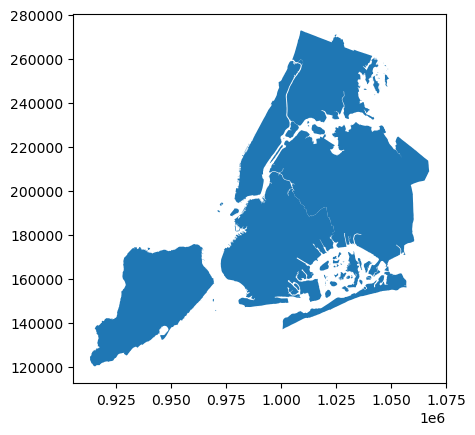

In [23]:
gdf.plot()